In [1]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scarches as sca
import urllib.request

In order to use the mouse gastrulation seqFISH datsets, please install squidpy (see https://github.com/scverse/squidpy).
Created a temporary directory at /tmp/tmpy_osbnuw
Writing /tmp/tmpy_osbnuw/_remote_module_non_scriptable.py
In order to use sagenet models, please install pytorch geometric (see https://pytorch-geometric.readthedocs.io) and 
 captum (see https://github.com/pytorch/captum).
mvTCR is not installed. To use mvTCR models, please install it first using "pip install mvtcr"
multigrate is not installed. To use multigrate models, please install it first using "pip install multigrate".


In [3]:
# TODO: learn more about `celltypist`, `scarches`

In [4]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [5]:
sc.set_figure_params(figsize=(5, 5))

In [6]:
adata = sc.read(
    filename="s4d8_clustered.h5ad",
    # backup_url="https://figshare.com/ndownloader/files/41436666",
)

# Manual annotation

## From markers to cluster annotation

In [7]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [8]:
# keep only the genes that we find in our adata object as markers for that cell type
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [9]:
# construct that UMAP here based on the scran-normalized count data, using only the highly deviant genes

adata.layers["counts"] = adata.X
adata.X = adata.layers["scran_normalization"]

adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [10]:
#  We’ll limit ourselves to B/plasma cell subtypes for this example
#  three negative markers in our list: IGHD and IGHM for B1 B, and PAX5 for plasmablasts
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

NAIVE CD20+ B:


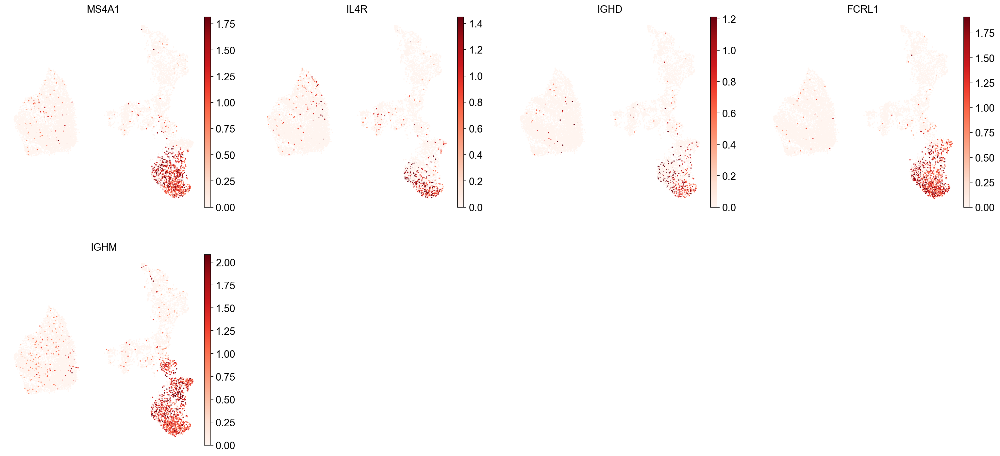





B1 B:


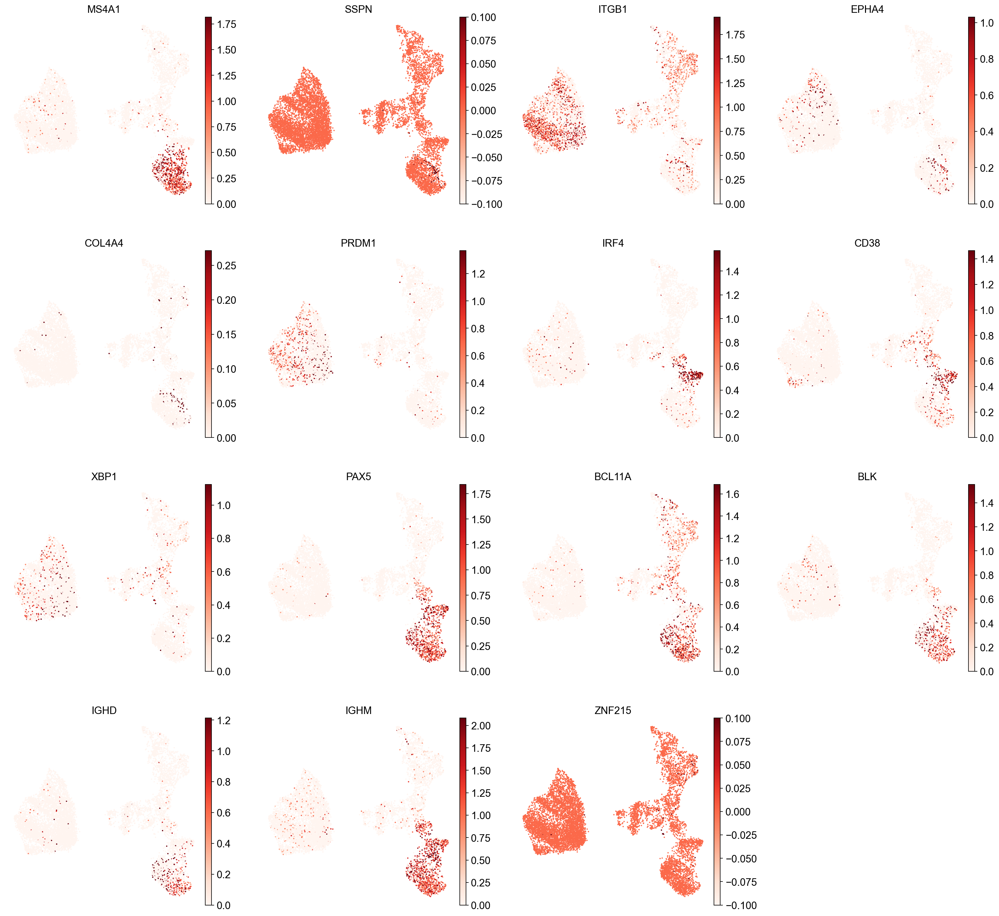





TRANSITIONAL B:


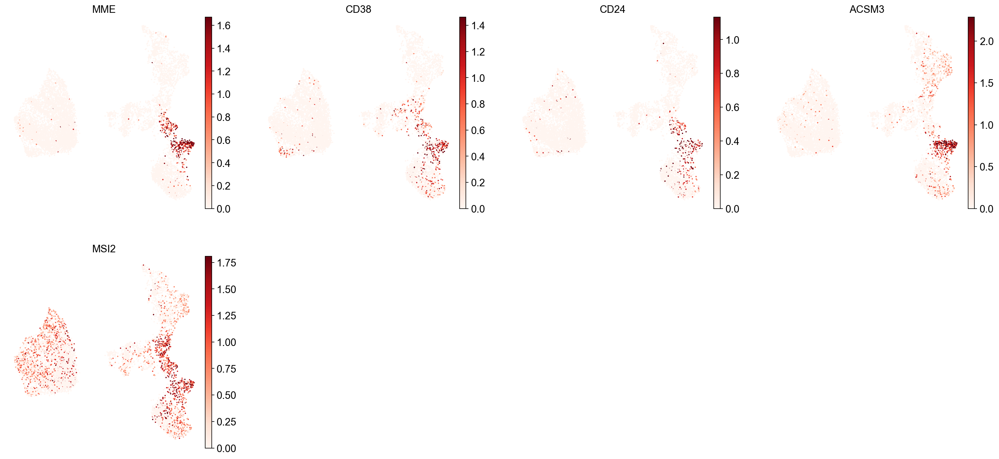





PLASMA CELLS:


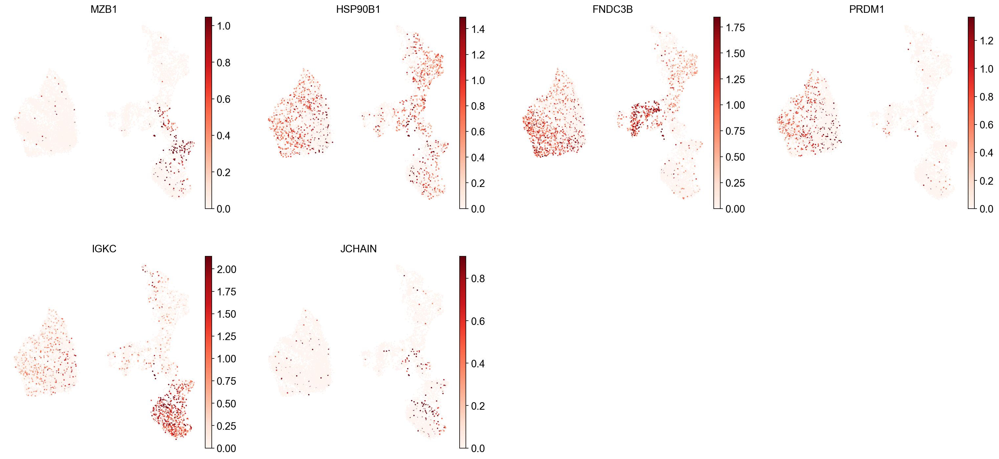





PLASMABLAST:


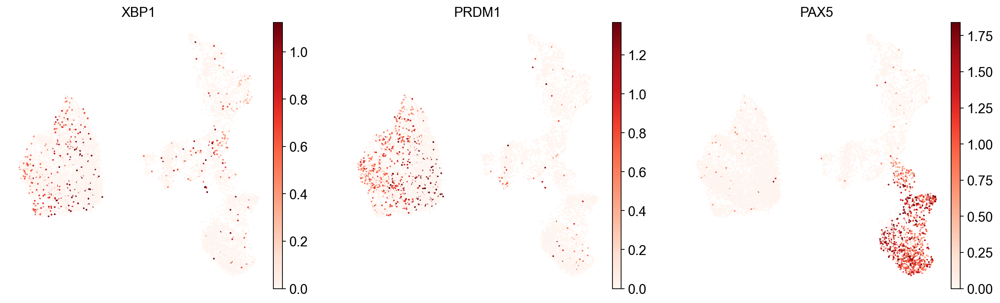

In [11]:
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

**Note:**

As you can see, even markers for a single cell type are often expressed in different subsets of the data, i.e. individual markers are often not uniquely expressed in a single cell type. Rather, it is the intersection of those subsets that will tell you where your cell type of interest is.

We can then annotate those clusters based on their overall marker expression patterns.

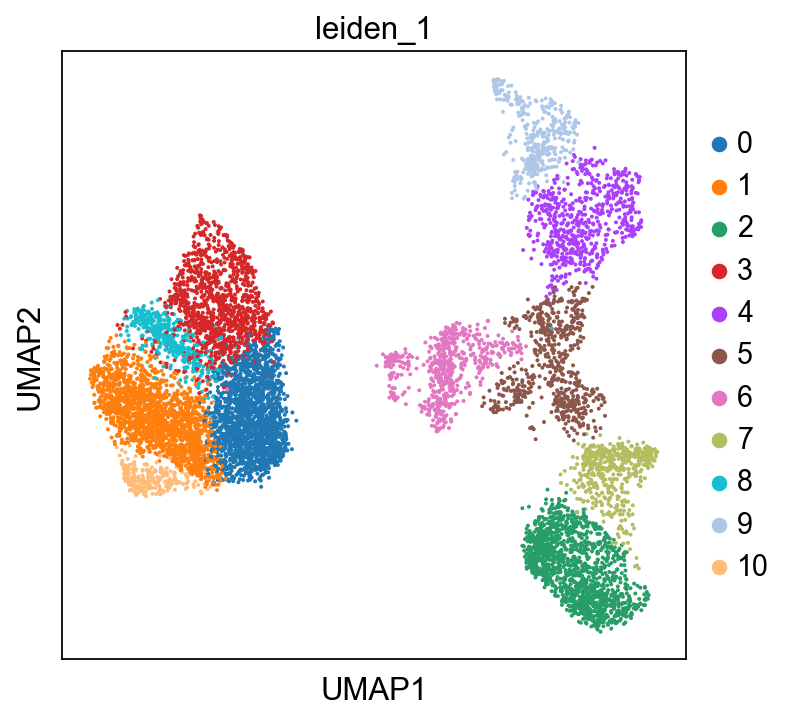

In [12]:
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")
sc.pl.umap(adata, color="leiden_1")

You might notice that this partitioning of the data is rather coarse and some of the marker expression patterns we saw above are not captured by this clustering. We can therefore try a higher resolution clustering by changing the resolution parameter of our clustering:

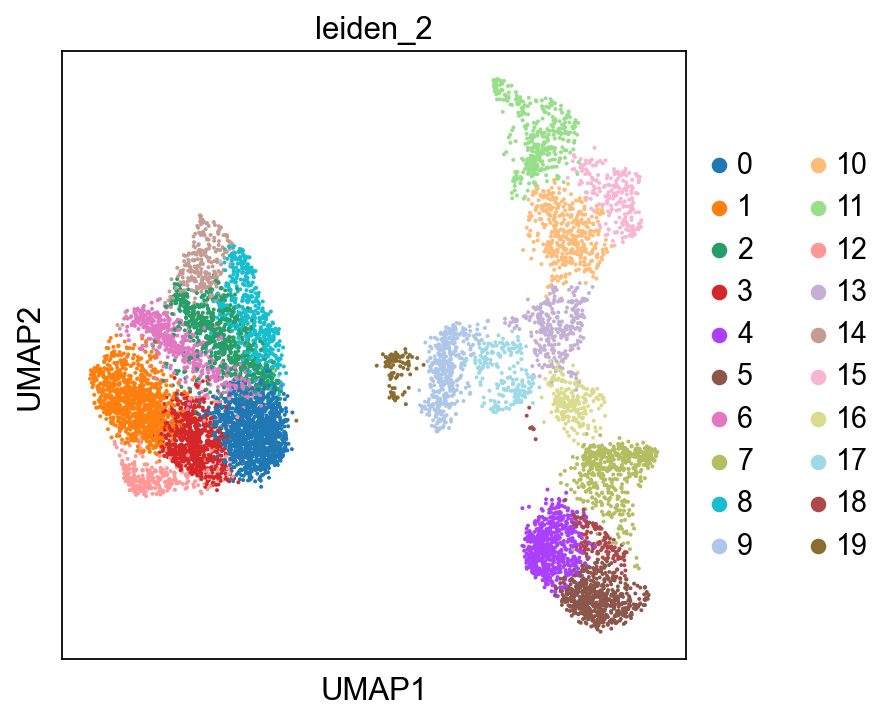

In [13]:
sc.tl.leiden(adata, resolution=2, key_added="leiden_2")
sc.pl.umap(adata, color="leiden_2")

In [14]:
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}

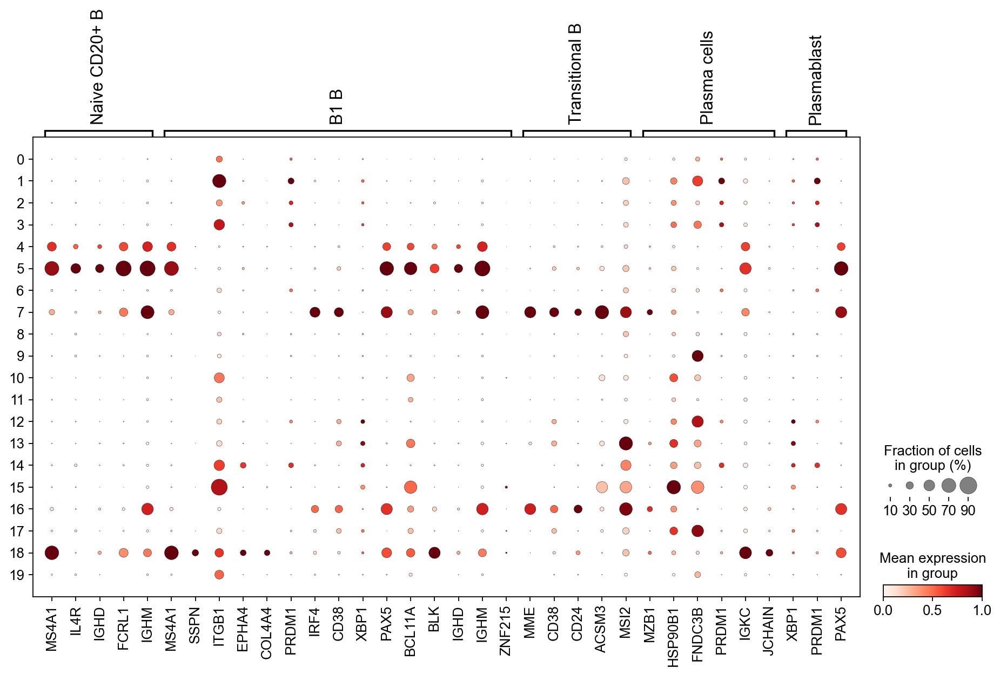

In [15]:
# visualize this using a dotplot

sc.pl.dotplot(
    adata,
    groupby="leiden_2",
    var_names=B_plasma_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [28]:
cl_annotation = {
    "4": "Naive CD20+ B",
    "5": "Naive CD20+ B",
    "8": "Transitional B",
    "18": "B1 B",  # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
}

You might notice that the annotation of B1 B cells is difficult, with none of the clusters expressing all the B1 B markers and several clusters expressing some of the markers. We often see that markers that work for one dataset do not work as well for others. This can be due to differences in sequencing depth, but also due to other sources of variation between datasets or samples

In [29]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

... storing 'manual_celltype_annotation' as categorical


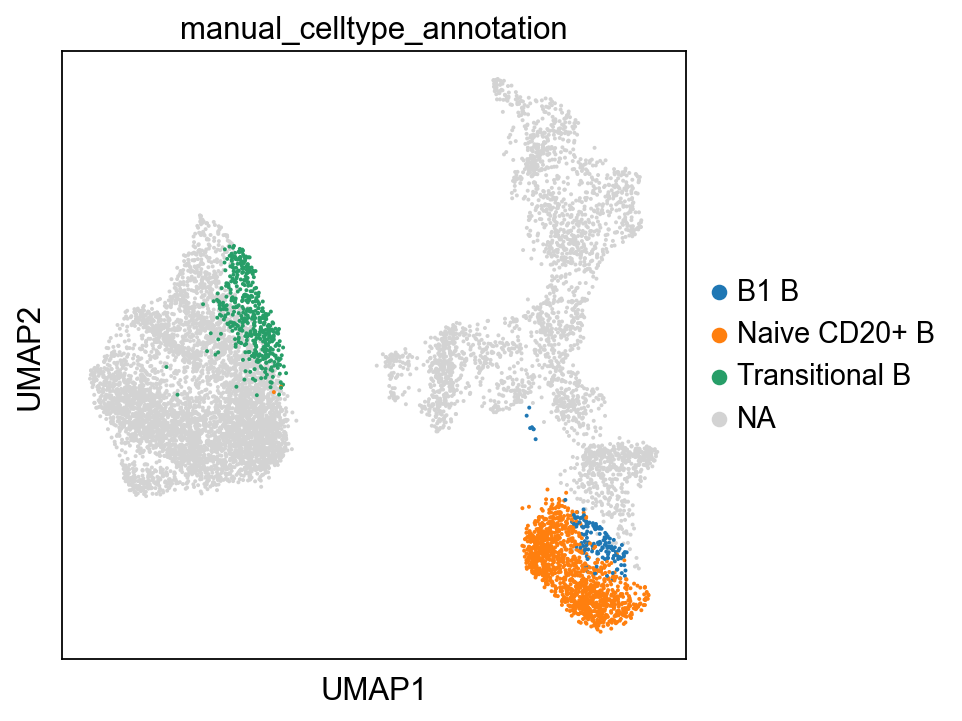

In [30]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

## From cluster differentially expressed genes to cluster annotation

For marker gene calculation of clusters simple methods such as the Wilcoxon rank-sum test are thought to perform best

Calculate the differentially expressed genes for every cluster, compared to the rest of the cells in our adata:

In [22]:
sc.tl.rank_genes_groups(
    adata, groupby="leiden_2", method="wilcoxon", key_added="dea_leiden_2"
)

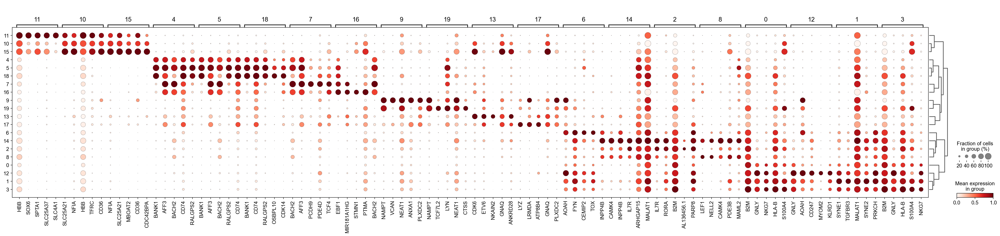

In [23]:
# We can visualize expression of the top differentially expressed genes per cluster
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_2", standard_scale="var", n_genes=5, key="dea_leiden_2"
)

In [25]:
# Filter the differentially expressed genes to select for more cluster-specific differentially expressed genes:

sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_2",
    key_added="dea_leiden_2_filtered",
)

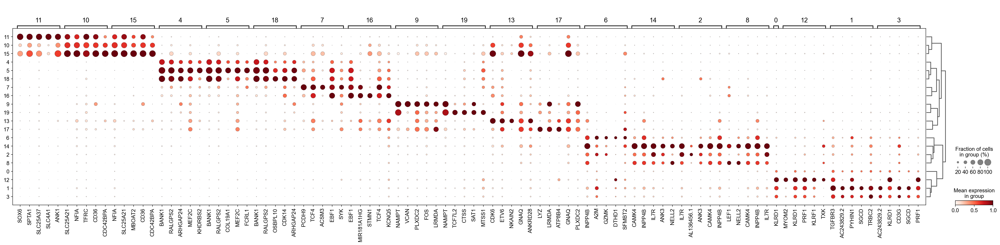

In [26]:
# Visualize the filtered genes

sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_2",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_2_filtered",
)

In [27]:
adata

AnnData object with n_obs × n_vars = 9370 × 31208
    obs: 'site', 'donor', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'batch', 'size_factors', 'leiden_1', 'leiden_2', 'manual_celltype_annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'highly_variable'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'manual_celltype_annotation_colors', 'dea_leiden_2', 'dendrogram_leiden_2', 'dea_leiden_2_filtered'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scran_normalizati

In [33]:
adata.uns['dea_leiden_2_filtered']['names']

rec.array([(nan, nan, 'IL7R', nan, 'BANK1', 'BANK1', nan, nan, 'LEF1', 'NAMPT', 'SLC25A21', nan, nan, 'CDK6', 'CAMK4', 'NFIA', 'EBF1', 'LYZ', 'BANK1', 'NAMPT'),
           (nan, 'TGFBR3', nan, nan, nan, nan, nan, nan, 'NELL2', 'VCAN', 'NFIA', 'SOX6', nan, 'ETV6', 'INPP4B', 'SLC25A21', 'MIR181A1HG', 'LRMDA', nan, 'TCF7L2'),
           (nan, nan, nan, nan, nan, nan, nan, 'PCDH9', 'CAMK4', nan, nan, 'SPTA1', nan, 'NKAIN2', 'IL7R', 'MBOAT2', 'STMN1', 'ATP8B4', 'RALGPS2', nan),
           (nan, nan, 'AL136456.1', nan, nan, 'RALGPS2', nan, nan, nan, nan, 'TFRC', 'SLC25A37', 'MYOM2', 'GNAQ', nan, 'CD36', nan, 'GNAQ', 'OSBPL10', nan),
           (nan, nan, nan, nan, 'RALGPS2', nan, 'INPP4B', 'TCF4', nan, 'PLXDC2', 'CD36', 'SLC4A1', 'KLRD1', 'ANKRD28', nan, 'CDC42BPA', nan, 'PLXDC2', 'CDK14', 'CTSS'),
           (nan, nan, 'ANK3', nan, 'ARHGAP24', nan, nan, nan, 'INPP4B', nan, 'CDC42BPA', 'ANK1', nan, 'ZNF385D', nan, 'ANK1', nan, 'NEGR1', 'ARHGAP24', nan),
           (nan, nan, nan, nan, 'MEF2C

Let’s take a look at cluster 13, which seems to have a set of relatively unique markers including CDK6, ETV6, NKAIN2, and GNAQ. Some googling tells us that NKAIN2 and ETV6 are hematopoietic stem cell markers

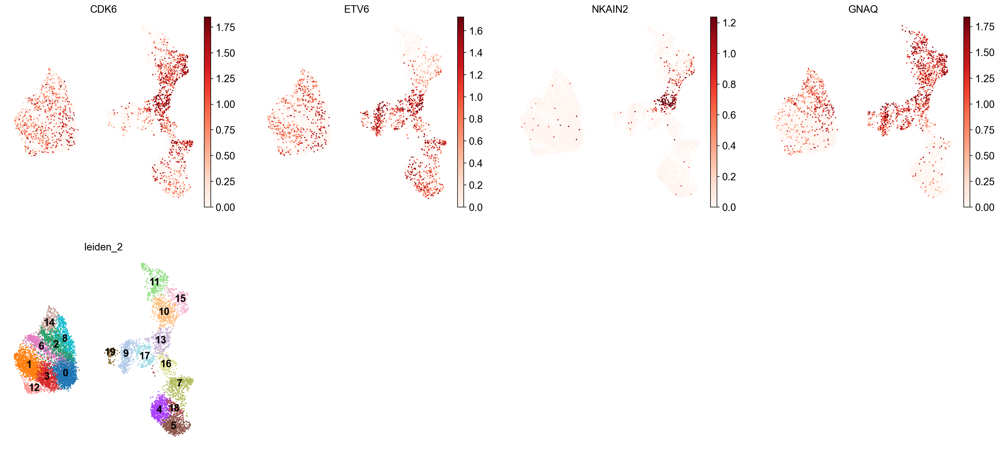

In [34]:
sc.pl.umap(
    adata,
    color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_2"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

However, looking at the known markers for the megakaryocyte/erythrocyte progenitors (“MK/E prog”), we see that part of cluster 13 seems to belong to that cell type:

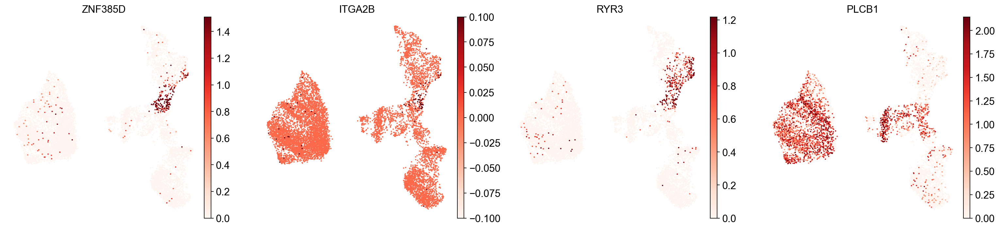

In [35]:
sc.pl.umap(
    adata,
    color=[
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

This highlights how complicated marker-based annotation is: it is sensitive to the cluster resolution you choose, the robustness and uniqueness of the marker sets you have, and your knowledge of the cell types to be expected in your data.

For this reason, the field is partly trying to move away from manual cluster annotation and rather moving towards automated annotation algorithms instead. The rest of this tutorial will focus on those options.

Before we move on, store the final bit of annotation information in our adata:

In [36]:
cl_annotation["13"] = "HSCs + MK/E prog (?)"

In [37]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

# Automated annotation

In [ ]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()